**UKLJUČIVANJE POTREBNIH ZAGLAVLJA I UČITAVANJE PODATAKA**

In [1]:
import random
import networkx as nx
from matplotlib import pyplot as plt
import numpy as np
import json 

In [2]:
# definisanje veličina koje će biti potrebne za provere da li je ulazna željena vrednost iz korektnog intervala
min_nodes = 1
min_components = 1
max_nodes = 100
max_degree = 50
max_components = 5

In [3]:
def read_instance(filepath):
    with open(filepath) as f: 
        data = f.read() 
    # rekonstrukcija sadrzaja fajla
    js = json.loads(data) 
  
    return js

In [5]:
inst = read_instance('testPrimeri/test1.txt')
inst2 = read_instance('testPrimeri/test2.txt')
inst3 = read_instance('testPrimeri/test3.txt')
inst4 = read_instance('testPrimeri/test4.txt')
inst5 = read_instance('testPrimeri/test5.txt')
inst6 = read_instance('testPrimeri/test6.txt')
inst7 = read_instance('testPrimeri/test7.txt')

**DEFINISANJE FUNKCIJA POTREBNIH ZA IMPLEMENTACIJU GENETSKOG ALGORITMA KOJI ĆE IMATI ULOGU DA GENERIŠE GRAFOVE**

In [6]:
class Individual:
    def __init__(self, num_nodes, avg_degree, avg_clustering_coeff, num_components, transitivity):
        self.num_components = num_components
        self.num_nodes = num_nodes
        self.avg_clustering_coeff = avg_clustering_coeff
        self.avg_degree = avg_degree
        self.graph = nx.erdos_renyi_graph(self.num_nodes, 0.5)
        self.transitivity = transitivity
        self.fitness = self.calc_fitness()
        
    def calc_fitness(self):
        num_of_graph_nodes = len(self.graph.nodes)
        graph_avg_degree = sum([self.graph.degree[i] for i in self.graph.nodes])/self.num_nodes
        graph_connected_components = nx.number_connected_components(self.graph)
        graph_clustering_coefficient = nx.average_clustering(self.graph)
        graph_transitivity = nx.transitivity(self.graph)
        # SVE VREDNOSTI KOJE ULAZE U JEDNACINU ZA FITNESS PREBACUJEMO U INTERVAL [0,1] DA NE BI BROJ ČVOROVA I STEPEN IMALI VEĆI UTICAJ OD OSTALOG
        return -((abs(num_of_graph_nodes - self.num_nodes))/max_nodes + abs(graph_avg_degree - self.avg_degree)/max_degree + 
                 abs(graph_clustering_coefficient - self.avg_clustering_coeff) + abs(graph_transitivity - self.transitivity)
                 + (abs(graph_connected_components - self.num_components)/max_components))

In [7]:
def selection(population, tournament_size):
    chosen = random.sample(population, tournament_size)
    return max(chosen, key=lambda x: x.fitness)

In [8]:
def crossover(parent1, parent2, child1, child2):
    random_pos = random.randrange(0, parent1.num_nodes)
    random_pos2 = random.randrange(0, parent1.num_nodes)

    adj_mat_par1 = nx.to_numpy_array(parent1.graph)
    adj_mat_par2 = nx.to_numpy_array(parent2.graph)
    adj_mat_cld1 = np.ndarray([len(parent1.graph.nodes), len(parent1.graph.nodes)])
    adj_mat_cld2 = np.ndarray([len(parent1.graph.nodes), len(parent1.graph.nodes)])

    for i in range(len(adj_mat_par1)):
        for j in range(len(adj_mat_par1[i])):
            if i <= random_pos and j <= random_pos2:
                adj_mat_cld1[i,j] = adj_mat_par1[i,j]
                adj_mat_cld2[i,j] = adj_mat_par2[i,j]
            else:
                adj_mat_cld2[i,j] = adj_mat_par1[i,j]
                adj_mat_cld1[i,j] = adj_mat_par2[i,j]
    child1.graph = nx.from_numpy_array(adj_mat_cld1)
    child2.graph = nx.from_numpy_array(adj_mat_cld2)

In [9]:
def mutation(individual, mutation_prob):
    adj_mat = nx.to_numpy_array(individual.graph)
    for i in range(len(adj_mat)):
        for j in range(len(adj_mat[i])):
            if random.random() < mutation_prob and i!=j:
                adj_mat[i,j] = not adj_mat[i,j]
                adj_mat[j,i] = not adj_mat[j,i]
    individual.graph = nx.from_numpy_array(adj_mat)

In [10]:
def ga(num_nodes=50, avg_degree=25, avg_cluster_coeff=0.5, num_connected_components=1, transitivity=0.5,
       population_size=100, num_generations=20, tournament_size=7, elitism_size=10, mutation_prob=0.05):
    population = [Individual(num_nodes=num_nodes, avg_degree=avg_degree, avg_clustering_coeff=avg_cluster_coeff, transitivity= transitivity,
        num_components=num_connected_components) for _ in range(population_size)]
    new_population = population.copy()
    
    for i in range(num_generations):
        population.sort(key=lambda x: x.fitness, reverse=True)
        new_population[:elitism_size] = population[:elitism_size]
        for j in range(elitism_size, population_size, 2):
            parent1 = selection(population, tournament_size)
            parent2 = selection(population, tournament_size) 

            # želimo da roditelji budu različite jedinke
            while(parent1 == parent2):
                parent2 = selection(population, tournament_size) 
            
            crossover(parent1, parent2, child1=new_population[j], child2=new_population[j+1])

            mutation(new_population[j], mutation_prob)
            mutation(new_population[j+1], mutation_prob)
            
            new_population[j].fitness = new_population[j].calc_fitness()
            new_population[j+1].fitness = new_population[j+1].calc_fitness()
        
        population = new_population.copy()
    return max(population, key=lambda x: x.fitness)

**DEFINISANJE ULAZNIH VREDNOSTI ALGORITMA I POKRETANJE ALGORITMA ZA RAZLIČITE ULAZNE VREDNOSTI**

In [26]:
num_of_nodes = []
avg_degrees = []
cluster_coeffs = []
connected_components = []
transitivity = []
population_size = [100, 50, 100, 50, 100, 50, 100, 50, 100, 50, 100, 50, 100, 50]
num_generations=20
tournament_size=7
elitism_size=10
mutation_prob=0.05

instances = [inst, inst, inst2, inst2, inst3, inst3, inst4, inst4, inst5, inst5, inst6, inst6, inst7, inst7]

for elem in instances:
    num_of_nodes.append(elem['num nodes'])
    avg_degrees.append(elem['average degree'])
    cluster_coeffs.append(elem['clustering coefficient'])
    connected_components.append(elem['num of connected components'])
    transitivity.append(elem['transitivity'])
print(num_of_nodes)
print(avg_degrees)
print(cluster_coeffs)
print(connected_components)
print(transitivity)

lists = [num_of_nodes, avg_degrees, cluster_coeffs, connected_components, transitivity]
for list in lists:
    if any(elem is None or elem <0 for elem in list):
        raise 

[6, 6, 10, 10, 10, 10, 25, 25, 50, 50, 75, 75, 100, 100]
[3.33, 3.33, 2, 2, 7.5, 7.5, 2.8, 2.8, 14.5, 14.5, 44.7, 44.7, 3.2, 3.2]
[0.7, 0.7, 0, 0, 0.83, 0.83, 0.13, 0.13, 0.31, 0.31, 0.6, 0.6, 0.03, 0.03]
[1, 1, 1, 1, 1, 1, 4, 4, 1, 1, 1, 1, 5, 5]
[0.75, 0.75, 0, 0, 0.83, 0.83, 0.12, 0.12, 0.31, 0.31, 0.6, 0.6, 0.02, 0.02]


-0.005622222222222093
-0.005622222222222093
-0.02
-0.015999999999999997
-0.01085664682539699
-0.006736282964629461
-1.2832926628926629
-1.2528776855378152
-0.45898283539623946
-0.44200014007646093
-0.007531980904111335
-0.015890695284337637
-2.6122425497135984
-2.597159336271236


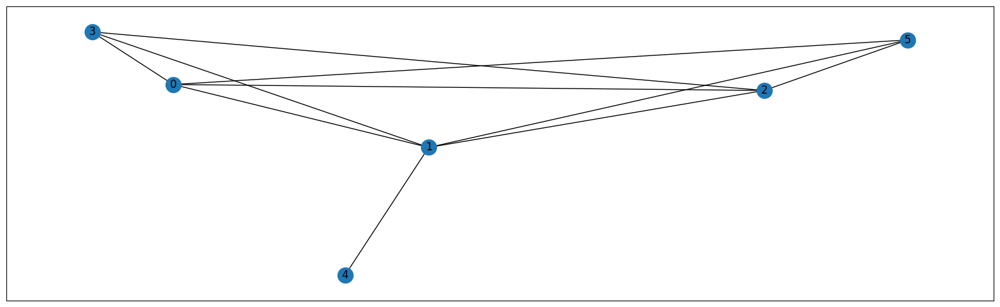

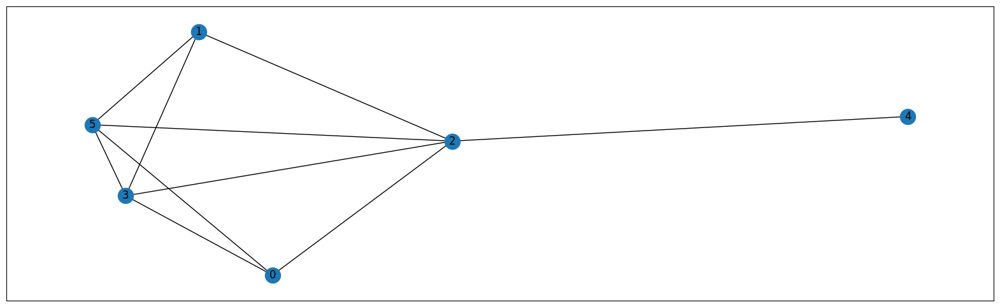

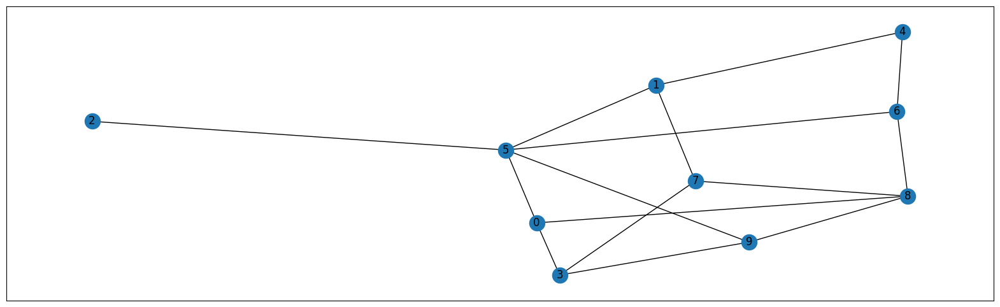

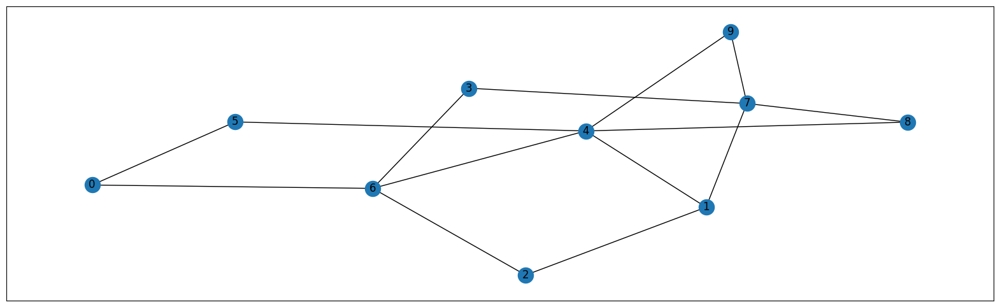

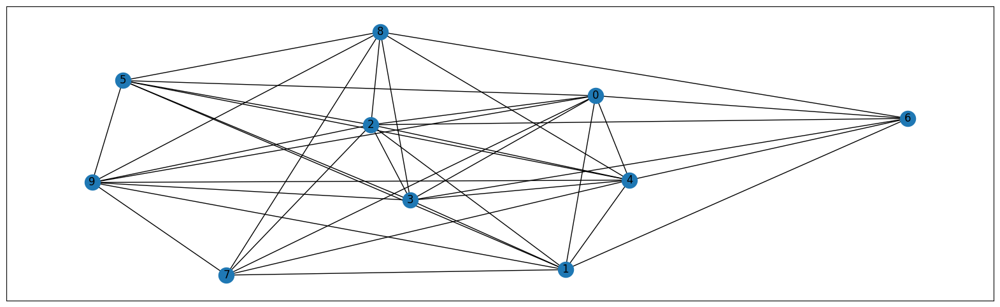

...

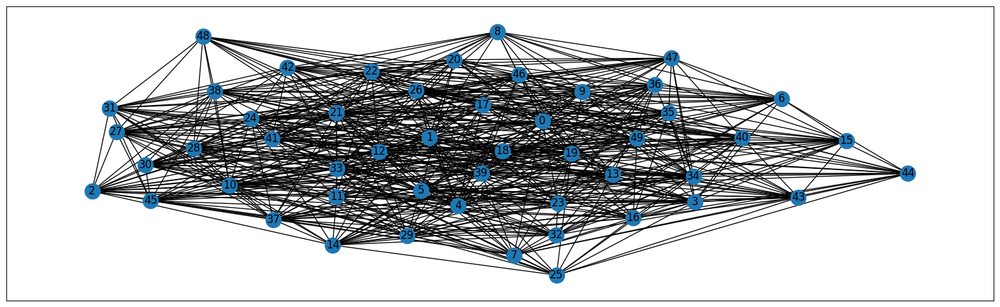

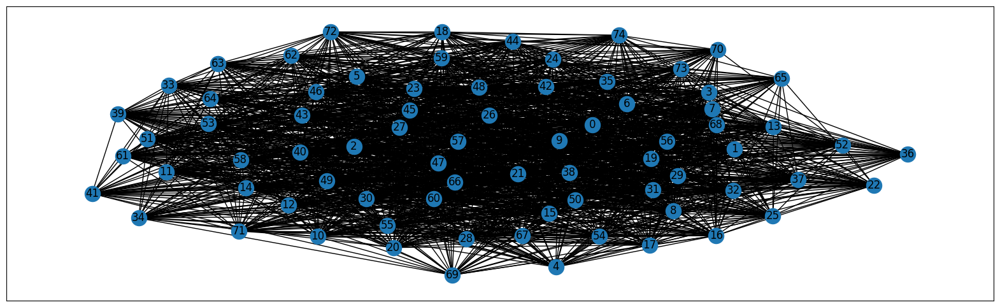

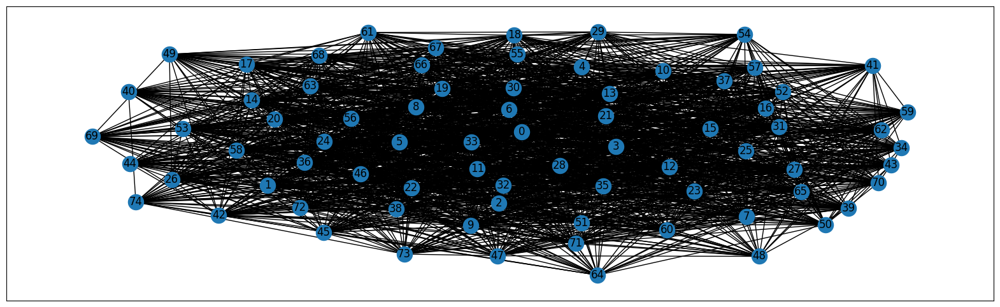

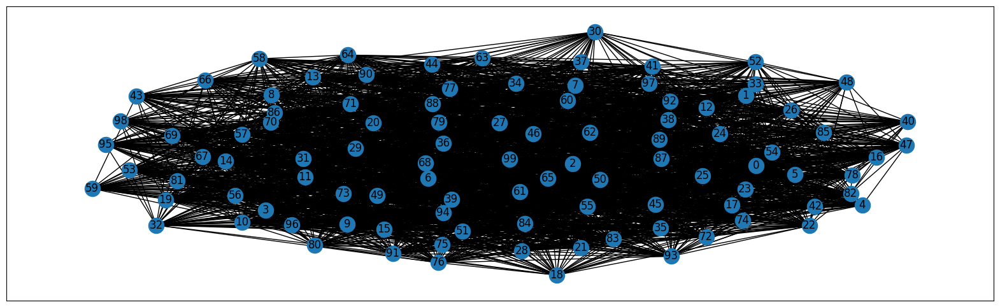

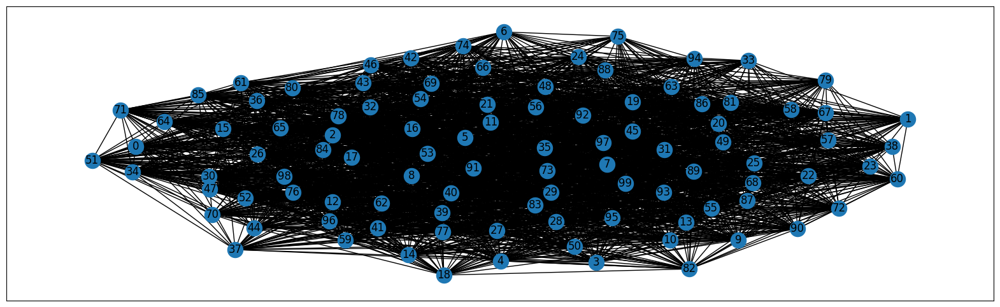

In [12]:
fitness_list = []
for i in range(len(num_of_nodes)):
    res=ga(num_of_nodes[i], avg_degrees[i], cluster_coeffs[i], connected_components[i], transitivity[i], population_size[i], num_generations, tournament_size, elitism_size, mutation_prob)
    fitness_list.append(res.fitness)
    print(res.fitness)
    
    fig, ax = plt.subplots(1,1, figsize=(20, 6))
    nx.draw_networkx(res.graph)

    f = open("rezultati/Nodes"+str(num_of_nodes[i])+"pop"+str(population_size[i])+".txt", "w")
    f.write("Population size: "+str(population_size[i])+"\n")
    f.write("Desired properties:\n")
    f.write("\tNum of nodes: "+str(num_of_nodes[i])+"\n")
    f.write("\tAverage degree: "+str(avg_degrees[i])+"\n")
    f.write("\tTransitivity: "+str(transitivity[i])+"\n")
    f.write("\tClustering coefficient: "+str(cluster_coeffs[i])+"\n")
    f.write("\tNum of connected components: "+str(connected_components[i])+"\n")
    f.write("Results:\n")
    f.write("\tNode degrees: "+str(nx.degree(res.graph))+"\n")
    f.write("\tAverage clustering coefficient: "+str(nx.average_clustering(res.graph))+"\n")
    f.write("\tNumber of connected components: "+str(len([len(c) for c in sorted(nx.connected_components(res.graph), key=len, reverse=True)]))+"\n")
    f.write("\tTransivity: "+str(nx.transitivity(res.graph))+"\n")
    f.write("\tFitness: "+str(res.fitness)+"\n")
    f.close()
    plt.savefig("slike/Nodes"+str(num_of_nodes[i])+"pop"+str(population_size[i])+".png")

**POSTOJI LI LINEARNI MODEL KOJI BI NA OSNOVU NEKE OD KOMPONENATA MOGAO DA PREDVIDI VREDNOST FITNESS FUNKCIJE?**

In [13]:
import pandas as pd

Text(0.5, 0, 'Number of nodes')

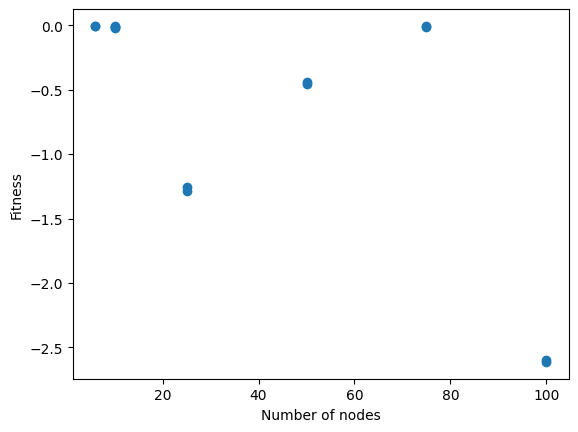

In [14]:
plt.scatter(num_of_nodes, fitness_list)
plt.ylabel("Fitness")
plt.xlabel("Number of nodes")

Text(0.5, 0, 'Average node degree')

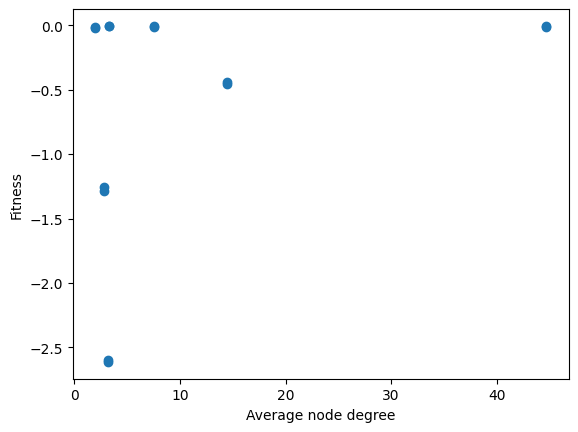

In [15]:
plt.scatter(avg_degrees, fitness_list)
plt.ylabel("Fitness")
plt.xlabel("Average node degree")

Text(0.5, 0, 'Number of connected components')

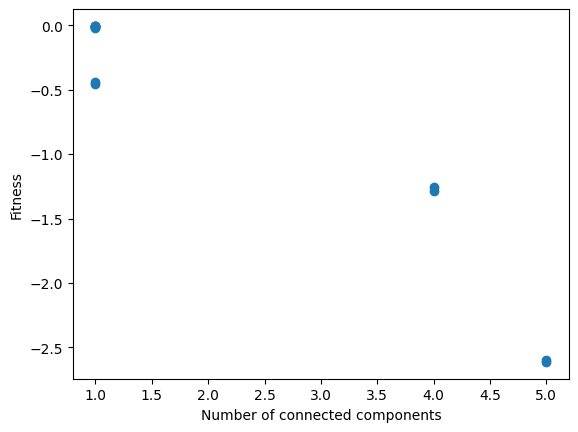

In [16]:
plt.scatter(connected_components, fitness_list)
plt.ylabel("Fitness")
plt.xlabel("Number of connected components")

Text(0.5, 0, 'Graph transitivity')

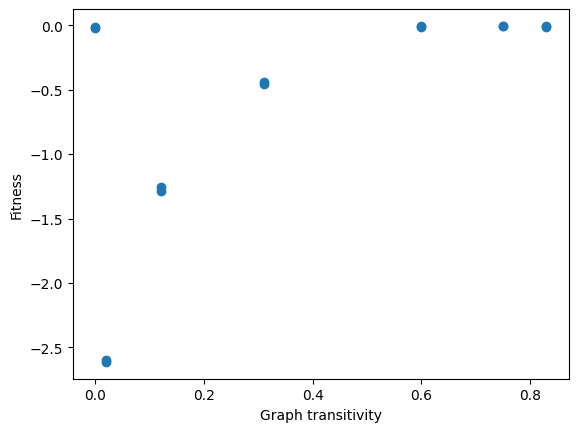

In [17]:
plt.scatter(transitivity, fitness_list)
plt.ylabel("Fitness")
plt.xlabel("Graph transitivity")

Text(0.5, 0, 'Average clustering coefficient')

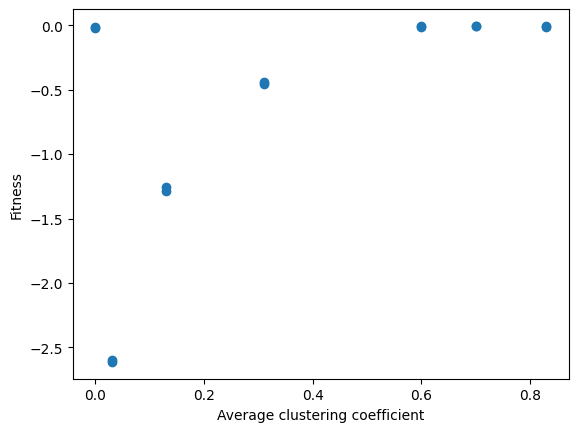

In [18]:
plt.scatter(cluster_coeffs, fitness_list)
plt.ylabel("Fitness")
plt.xlabel("Average clustering coefficient")

In [19]:
data = {
    'fitness': fitness_list,
    'num_of_nodes': num_of_nodes,
    'avg_degree': avg_degrees,
    'num_components': connected_components,
    'transitivity': transitivity,
    'clustering_coeff': cluster_coeffs
}

# form dataframe
dataframe = pd.DataFrame(data, columns=['fitness', 'num_of_nodes', 'avg_degree', 'num_components', 'transitivity', 'clustering_coeff'])
#print("Dataframe is : ")
#print(dataframe)

# form correlation matrix
matrix = dataframe.corr()
print("Correlation matrix is : ")
print(matrix)

Correlation matrix is : 
                   fitness  num_of_nodes  avg_degree  num_components  \
fitness           1.000000     -0.658670    0.323508       -0.958681   
num_of_nodes     -0.658670      1.000000    0.442679        0.521044   
avg_degree        0.323508      0.442679    1.000000       -0.354475   
num_components   -0.958681      0.521044   -0.354475        1.000000   
transitivity      0.615751     -0.329264    0.343455       -0.602434   
clustering_coeff  0.608040     -0.311776    0.362305       -0.594298   

                  transitivity  clustering_coeff  
fitness               0.615751          0.608040  
num_of_nodes         -0.329264         -0.311776  
avg_degree            0.343455          0.362305  
num_components       -0.602434         -0.594298  
transitivity          1.000000          0.998739  
clustering_coeff      0.998739          1.000000  


**BONUS TEST PRIMERI**

In [26]:
res = ga(100, 36, 0.43, 2, 0.45, 100, 20, 7, 10, 0.05)

In [27]:
def write_to_file(population_size, num_nodes, avg_degree, clustering_coeff, num_components, transitivity, res, file_name):
    f = open(file_name, "w")
    f.write("Population size: "+str(population_size)+"\n")
    f.write("Desired properties:\n")
    f.write("\tNum of nodes: "+str(num_nodes)+"\n")
    f.write("\tAverage degree: "+str(avg_degree)+"\n")
    f.write("\tTransitivity: "+str(transitivity)+"\n")
    f.write("\tClustering coefficient: "+str(clustering_coeff)+"\n")
    f.write("\tNum of connected components: "+str(num_components)+"\n")
    f.write("Results:\n")
    f.write("\tNode degrees: "+str(nx.degree(res.graph))+"\n")
    f.write("\tAverage clustering coefficient: "+str(nx.average_clustering(res.graph))+"\n")
    f.write("\tNumber of connected components: "+str(len([len(c) for c in sorted(nx.connected_components(res.graph), key=len, reverse=True)]))+"\n")
    f.write("\tTransivity: "+str(nx.transitivity(res.graph))+"\n")
    f.write("\tFitness: "+str(res.fitness)+"\n")
    f.close()

-0.4521703030374372


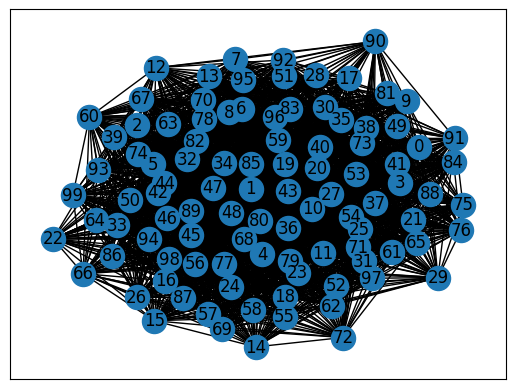

In [29]:
nx.draw_networkx(res.graph)
print(res.fitness)
write_to_file(100, 100, 36, 0.43, 2, 0.45, res, "rezultati/Bonus1.txt")
plt.savefig("slike/BonusTest1.png")

In [30]:
res = ga(100, 42, 0.47, 1, 0.53, 100, 20, 7, 10, 0.05)

-0.19286999575305058


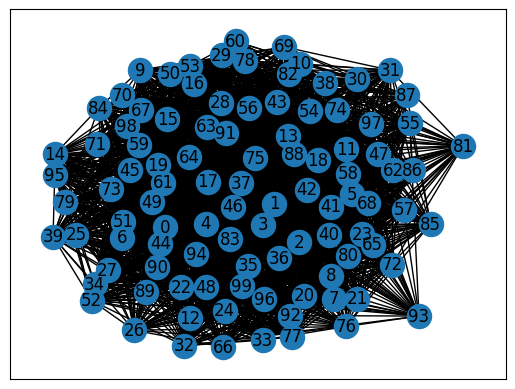

In [31]:
nx.draw_networkx(res.graph)
print(res.fitness)
write_to_file(100, 100, 42, 0.47, 1, 0.53, res, "rezultati/Bonus2.txt")
plt.savefig("slike/BonusTest2.png")

**TEST: ŠTA SE DEŠAVA AKO SE PROMENI VEROVATNOĆA SA KOJOM SE GENERIŠU GRANE U POČETNOM GRAFU**

In [20]:
class Individual2:
    def __init__(self, num_nodes, avg_degree, avg_clustering_coeff, num_components, transitivity):
        self.num_components = num_components
        self.num_nodes = num_nodes
        self.avg_clustering_coeff = avg_clustering_coeff
        self.avg_degree = avg_degree
        self.graph = nx.erdos_renyi_graph(self.num_nodes, 0.2)
        self.transitivity = transitivity
        self.fitness = self.calc_fitness()
        
    def calc_fitness(self):
        num_of_graph_nodes = len(self.graph.nodes)
        graph_avg_degree = sum([self.graph.degree[i] for i in self.graph.nodes])/self.num_nodes
        graph_connected_components = nx.number_connected_components(self.graph)
        graph_clustering_coefficient = nx.average_clustering(self.graph)
        graph_transitivity = nx.transitivity(self.graph)
        # SVE VREDNOSTI KOJE ULAZE U JEDNACINU ZA FITNESS PREBACUJEMO U INTERVAL [0,1] DA NE BI BROJ ČVOROVA I STEPEN IMALI VEĆI UTICAJ OD OSTALOG
        return -((abs(num_of_graph_nodes - self.num_nodes))/max_nodes + abs(graph_avg_degree - self.avg_degree)/max_degree + 
                 abs(graph_clustering_coefficient - self.avg_clustering_coeff) + abs(graph_transitivity - self.transitivity)
                 + (abs(graph_connected_components - self.num_components)/max_components))

In [21]:
def ga2(num_nodes, avg_degree, avg_cluster_coeff, num_connected_components, transitivity,
       population_size, num_generations, tournament_size, elitism_size, mutation_prob):
    population = [Individual2(num_nodes=num_nodes, avg_degree=avg_degree, avg_clustering_coeff=avg_cluster_coeff, transitivity= transitivity,
        num_components=num_connected_components) for _ in range(population_size)]
    new_population = population.copy()
    
    for i in range(num_generations):
        population.sort(key=lambda x: x.fitness, reverse=True)
        new_population[:elitism_size] = population[:elitism_size]
        for j in range(elitism_size, population_size, 2):
            parent1 = selection(population, tournament_size)
            parent2 = selection(population, tournament_size) # TODO razlikuju se
            
            crossover(parent1, parent2, child1=new_population[j], child2=new_population[j+1])

            mutation(new_population[j], mutation_prob)
            mutation(new_population[j+1], mutation_prob)
            
            new_population[j].fitness = new_population[j].calc_fitness()
            new_population[j+1].fitness = new_population[j+1].calc_fitness()
        
        population = new_population.copy()
    return max(population, key=lambda x: x.fitness)

-0.005622222222222093
-0.005622222222222093
-0.1395151515151515
-0.012000000000000002
-0.005387076615423028
-0.008549953314659122
-0.48526616541353385
-0.6687809523809524
-0.46940357205102456
-0.420012338376997
-0.012004898528627055
-0.0125517293241569
-2.6324747759596843
-1.428400037947298


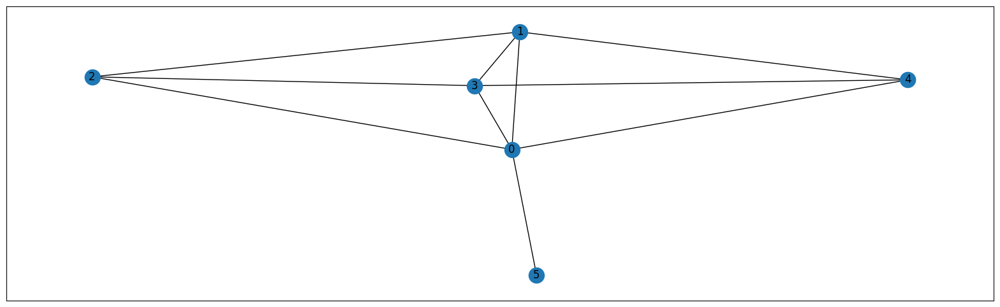

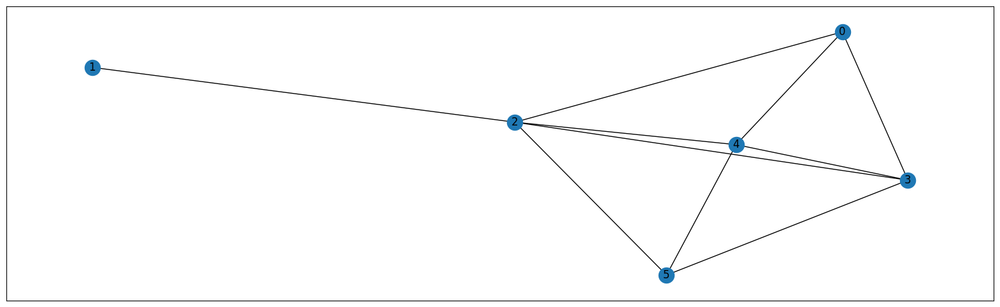

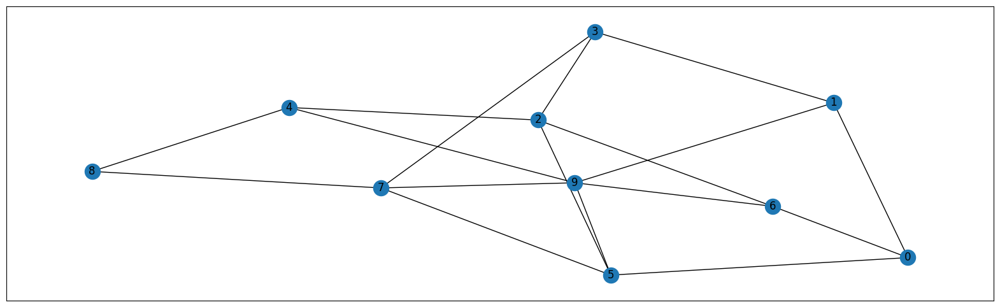

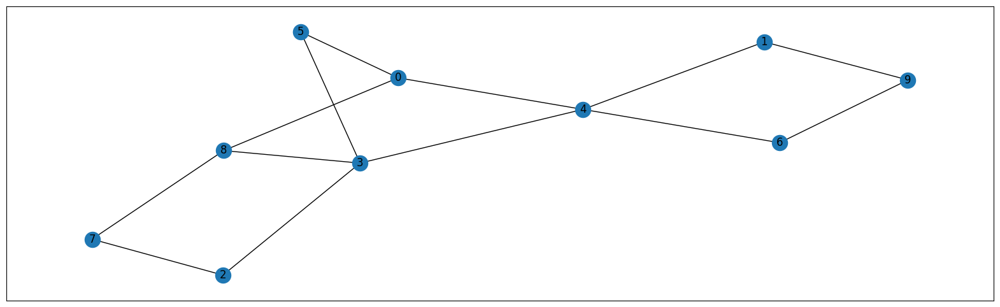

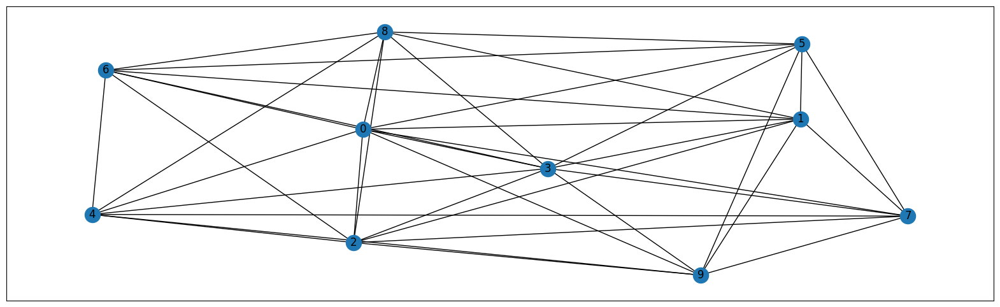

...

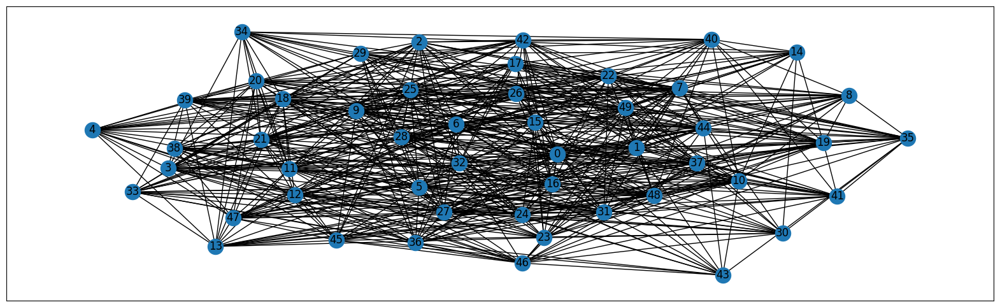

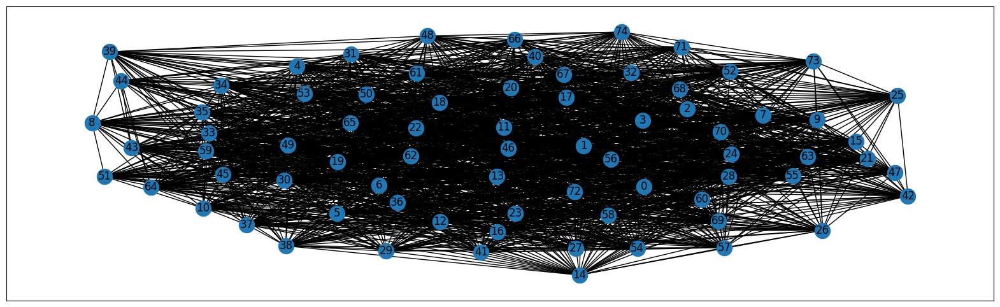

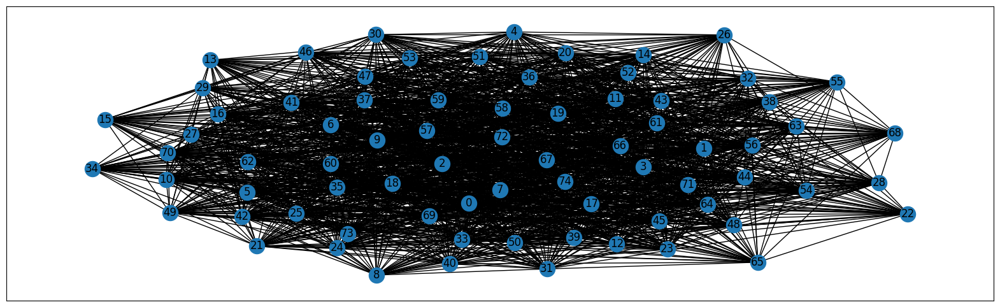

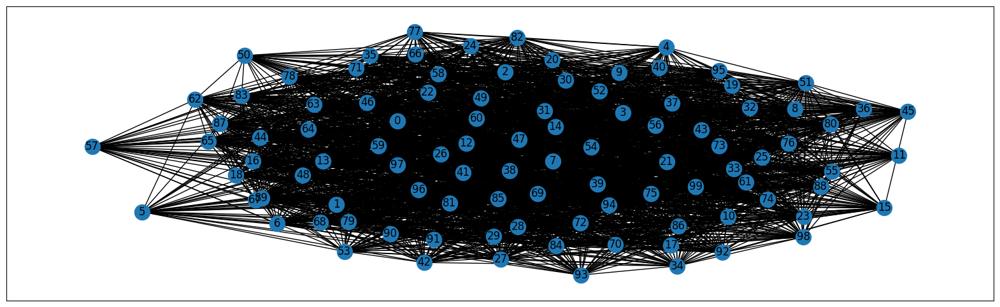

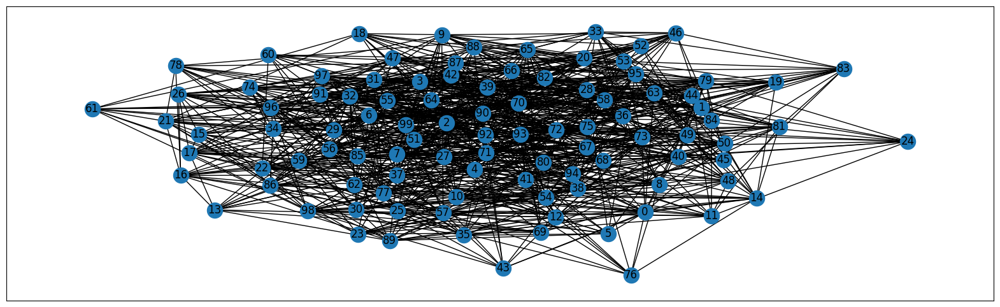

In [23]:
fitness_list = []
for i in range(len(num_of_nodes)):
    res=ga2(num_of_nodes[i], avg_degrees[i], cluster_coeffs[i], connected_components[i], transitivity[i], population_size[i], 
            num_generations, tournament_size, elitism_size, mutation_prob)
    fitness_list.append(res.fitness)
    print(res.fitness)
    
    fig, ax = plt.subplots(1,1, figsize=(20, 6))
    nx.draw_networkx(res.graph)

    f = open("rezultati/Nodes"+str(num_of_nodes[i])+"pop"+str(population_size[i])+"prob02.txt", "w")
    f.write("Population size: "+str(population_size[i])+"\n")
    f.write("Desired properties:\n")
    f.write("\tNum of nodes: "+str(num_of_nodes[i])+"\n")
    f.write("\tAverage degree: "+str(avg_degrees[i])+"\n")
    f.write("\tTransitivity: "+str(transitivity[i])+"\n")
    f.write("\tClustering coefficient: "+str(cluster_coeffs[i])+"\n")
    f.write("\tNum of connected components: "+str(connected_components[i])+"\n")
    f.write("Results:\n")
    f.write("\tNode degrees: "+str(nx.degree(res.graph))+"\n")
    f.write("\tAverage clustering coefficient: "+str(nx.average_clustering(res.graph))+"\n")
    f.write("\tNumber of connected components: "+str(len([len(c) for c in sorted(nx.connected_components(res.graph), key=len, reverse=True)]))+"\n")
    f.write("\tTransivity: "+str(nx.transitivity(res.graph))+"\n")
    f.write("\tFitness: "+str(res.fitness)+"\n")
    f.close()
    plt.savefig("slike/Nodes"+str(num_of_nodes[i])+"pop"+str(population_size[i])+"prob03.png")

-0.06117777777777778
-0.005622222222222093
-0.21071794871794872
-0.4827692307692308
-0.006736282964629461
-0.036000000000000136
-1.283509261380821
-1.4037338762346439
-0.44939682755602156
-0.4757752270329916
-0.013052419602693637
-0.0099214931224301
-2.6392986448062357
-2.595627933058239


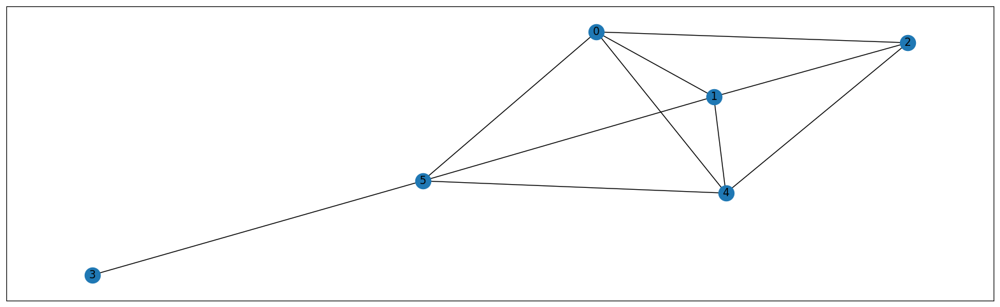

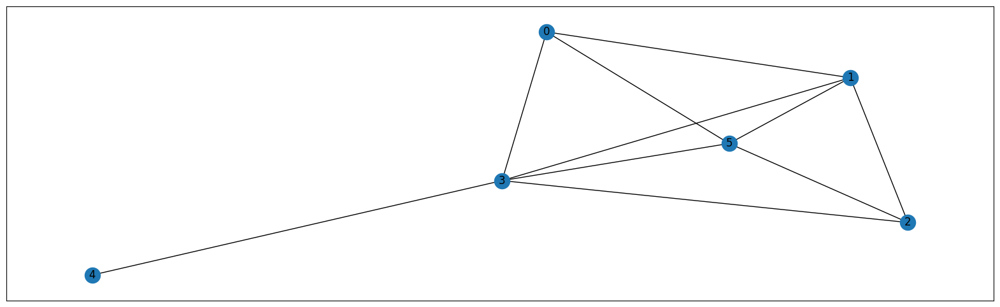

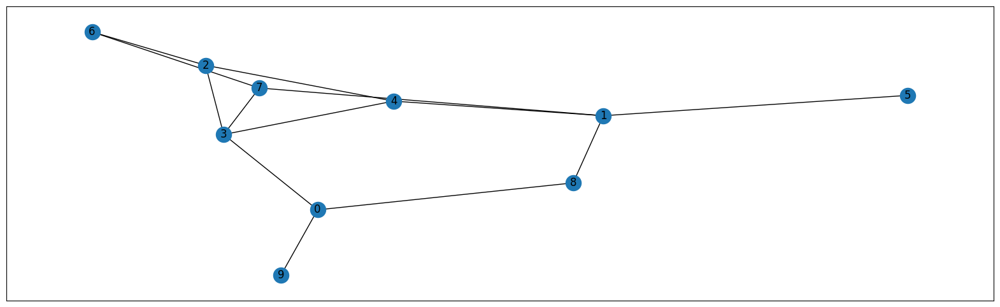

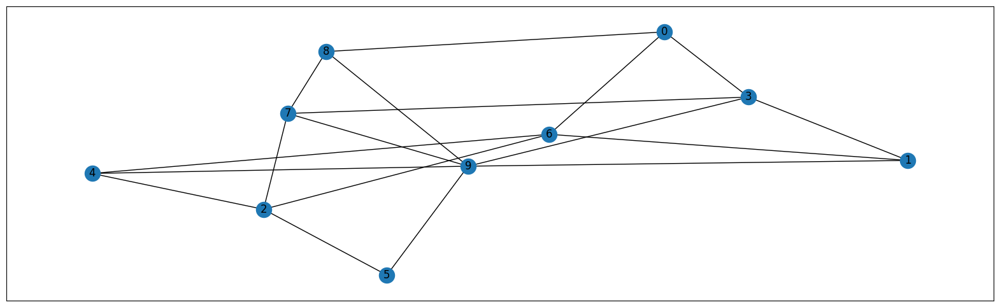

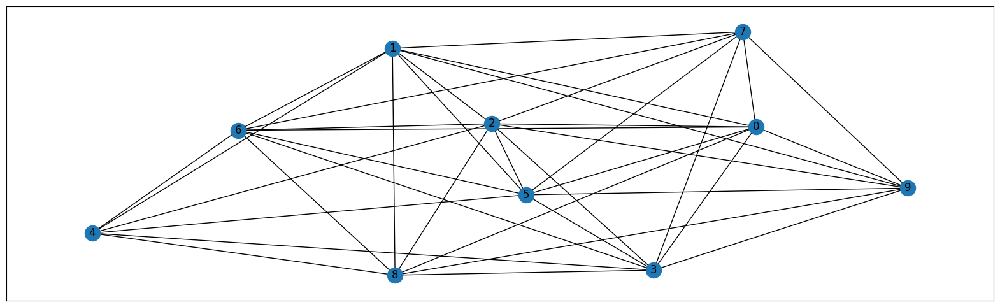

...

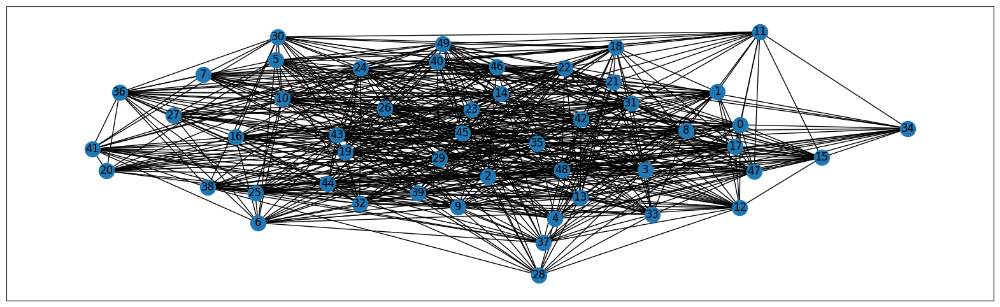

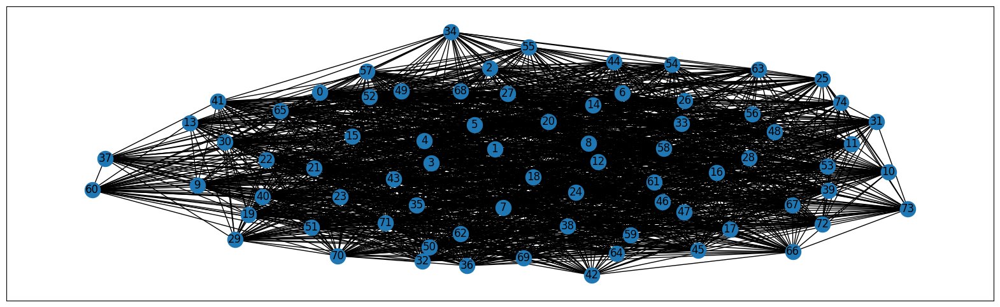

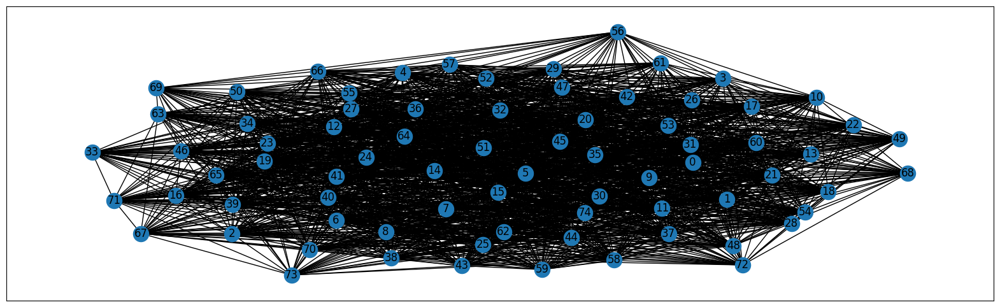

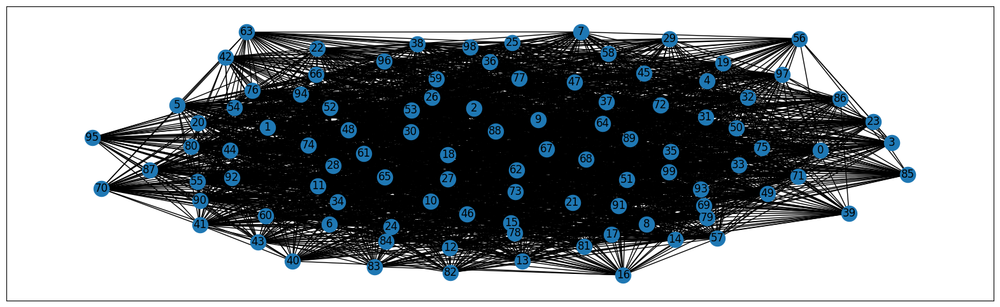

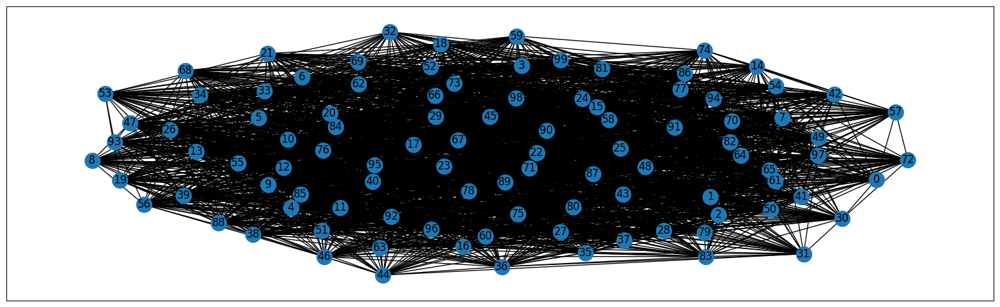

In [24]:
fitness_list = []
mutation_prob = 0.1
for i in range(len(num_of_nodes)):
    res=ga(num_of_nodes[i], avg_degrees[i], cluster_coeffs[i], connected_components[i], transitivity[i], population_size[i], 
            num_generations, tournament_size, elitism_size, mutation_prob)
    fitness_list.append(res.fitness)
    print(res.fitness)
    
    fig, ax = plt.subplots(1,1, figsize=(20, 6))
    nx.draw_networkx(res.graph)

    f = open("rezultati/Nodes"+str(num_of_nodes[i])+"pop"+str(population_size[i])+"mutationProb01.txt", "w")
    f.write("Population size: "+str(population_size[i])+"\n")
    f.write("Desired properties:\n")
    f.write("\tNum of nodes: "+str(num_of_nodes[i])+"\n")
    f.write("\tAverage degree: "+str(avg_degrees[i])+"\n")
    f.write("\tTransitivity: "+str(transitivity[i])+"\n")
    f.write("\tClustering coefficient: "+str(cluster_coeffs[i])+"\n")
    f.write("\tNum of connected components: "+str(connected_components[i])+"\n")
    f.write("Results:\n")
    f.write("\tNode degrees: "+str(nx.degree(res.graph))+"\n")
    f.write("\tAverage clustering coefficient: "+str(nx.average_clustering(res.graph))+"\n")
    f.write("\tNumber of connected components: "+str(len([len(c) for c in sorted(nx.connected_components(res.graph), key=len, reverse=True)]))+"\n")
    f.write("\tTransivity: "+str(nx.transitivity(res.graph))+"\n")
    f.write("\tFitness: "+str(res.fitness)+"\n")
    f.close()
    plt.savefig("slike/Nodes"+str(num_of_nodes[i])+"pop"+str(population_size[i])+"mutationProb01.png")